<a href="https://www.kaggle.com/code/aabdollahii/conditional-gan?scriptVersionId=298675058" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

 Device: cuda
   GPU: Tesla T4
   Memory: 14.6 GB

 Reading all the features...
   Total pictures : 202,599
   Total features : 40
   Black_Hair: 48,472 (23.9%)
   Brown_Hair: 41,572 (20.5%)
   Smiling: 97,669 (48.2%)

 Filtering: Black_Hair or Brown_Hair ...
   After filter : 88,908 pictures

 Feature distribution: 
    Black_Hair only: 47,336
    Brown_Hair only: 40,436
    Both of them   : 1,136
    Smiling        : 43,654 (49.1%)

 Addressing class imbalance ...
   Black_Hair only: 47,336
   Brown_Hair only: 40,436
   Both:            1,136
   Balance count per group: 40,436
   Final count: 82,008

 Final review :
   Black_Hair=1: 41,572 (50.7%)
   Brown_Hair=1: 41,572 (50.7%)
   Smiling=1:    40,358 (49.2%)

 DataLoader Stats:
   Total samples : 82,008
   Total batches : 320
   Batch size    : 256

 Visualizing samples :
   Image batch shape: torch.Size([256, 3, 64, 64])
   Label batch shape: torch.Size([256, 3])
   Label sample[0]: [1.0, 0.0, 0.0] -> Black=1, Brown=0, Smile=0


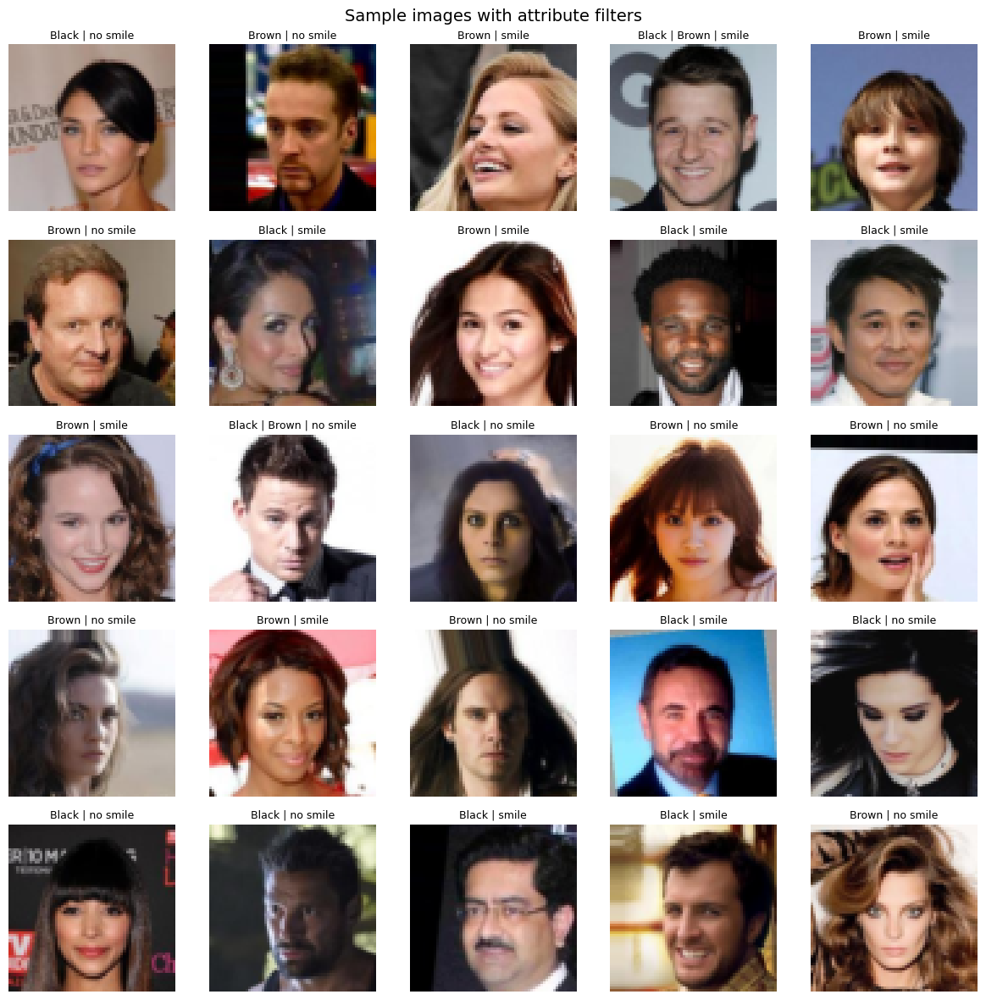


 Setup Complete


In [1]:
# ============================================================
#  Cell 1: Settings, Data Loading, and Preprocessing
# ============================================================

import os
import random
import numpy as np
import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision.models import inception_v3
import torch.nn.functional as F
from scipy import linalg

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

# ---------- Seed ----------
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

# ---------- Config ----------
CONFIG = {
    'img_dir': '/kaggle/input/datasets/jessicali9530/celeba-dataset/img_align_celeba/img_align_celeba',
    'attr_path': '/kaggle/input/datasets/jessicali9530/celeba-dataset/list_attr_celeba.csv',

    'image_size': 64,
    'nc': 3,

    'nz': 100,
    'n_classes': 3,        # [Black_Hair, Brown_Hair, Smiling]
    'ngf': 32,
    'ndf': 32,

    'batch_size': 256,
    'num_epochs': 50,
    'lr_g': 0.0002,
    'lr_d': 0.0004,
    'beta1': 0.5,
    'beta2': 0.999,
    'real_label_val': 0.9,
    'fake_label_val': 0.0,

    # FID
    'fid_samples': 1024,
    'fid_batch_size': 64,
    'fid_interval': 5,       

    # represent
    'sample_interval': 5,    # Save samples every 5 epochs
    'num_display': 25,       # Number of display images (5x5)

    # How many sample we going to use (I have to say all of them)
    'max_samples': None,     # None = all data
}

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f" Device: {DEVICE}")
if torch.cuda.is_available():
    print(f"   GPU: {torch.cuda.get_device_name(0)}")
    print(f"   Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")

# ---------- Transforms ----------
transform = transforms.Compose([
    transforms.Resize(CONFIG['image_size']),
    transforms.CenterCrop(CONFIG['image_size']),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3),
])

# ---------- feature of csv  ----------
print("\n Reading all the features...")
attr_df = pd.read_csv(CONFIG['attr_path'])
print(f"   Total pictures : {len(attr_df):,}")
print(f"   Total features : {len(attr_df.columns) - 1}")

# Normalize output values
attr_columns = [c for c in attr_df.columns if c != 'image_id']
attr_df[attr_columns] = (attr_df[attr_columns] + 1) // 2  # -1 -> 0, 1 -> 1

# Feature Engineering
required_attrs = ['Black_Hair', 'Brown_Hair', 'Smiling']
for attr in required_attrs:
    # Ensure feature availability
    assert attr in attr_df.columns, f"This feature is not available: '{attr}' !"
    count = attr_df[attr].sum()
    print(f"   {attr}: {count:,} ({count/len(attr_df)*100:.1f}%)")


# ----------  Black_Hair OR Brown_Hair ----------
print("\n Filtering: Black_Hair or Brown_Hair ...")
mask = (attr_df['Black_Hair'] == 1) | (attr_df['Brown_Hair'] == 1)
filtered_df = attr_df[mask].copy()
print(f"   After filter : {len(filtered_df):,} pictures")


black_only = (filtered_df['Black_Hair'] == 1) & (filtered_df['Brown_Hair'] == 0)
brown_only = (filtered_df['Black_Hair'] == 0) & (filtered_df['Brown_Hair'] == 1)
both_hair  = (filtered_df['Black_Hair'] == 1) & (filtered_df['Brown_Hair'] == 1)


print(f"\n Feature distribution: ")
print(f"    Black_Hair only: {black_only.sum():,}")
print(f"    Brown_Hair only: {brown_only.sum():,}")
print(f"    Both of them   : {both_hair.sum():,}")
print(f"    Smiling        : {filtered_df['Smiling'].sum():,} ({filtered_df['Smiling'].mean()*100:.1f}%)")


print("\n Addressing class imbalance ...")
black_indices = filtered_df[black_only].index.tolist()
brown_indices = filtered_df[brown_only].index.tolist()
both_indices  = filtered_df[both_hair].index.tolist()

min_count = min(len(black_indices), len(brown_indices))
print(f"   Black_Hair only: {len(black_indices):,}")
print(f"   Brown_Hair only: {len(brown_indices):,}")
print(f"   Both:            {len(both_indices):,}")
print(f"   Balance count per group: {min_count:,}")

random.shuffle(black_indices)
random.shuffle(brown_indices)
random.shuffle(both_indices)

selected_indices = black_indices[:min_count] + brown_indices[:min_count] + both_indices
random.shuffle(selected_indices)

# Create balanced DataFrame
balanced_df = attr_df.loc[selected_indices].reset_index(drop=True)
print(f"   Final count: {len(balanced_df):,}")

if CONFIG['max_samples'] and len(balanced_df) > CONFIG['max_samples']:
    balanced_df = balanced_df.sample(n=CONFIG['max_samples'], random_state=42).reset_index(drop=True)
    print(f"   Limited to : {len(balanced_df):,}")

print(f"\n Final review :")
print(f"   Black_Hair=1: {balanced_df['Black_Hair'].sum():,} ({balanced_df['Black_Hair'].mean()*100:.1f}%)")
print(f"   Brown_Hair=1: {balanced_df['Brown_Hair'].sum():,} ({balanced_df['Brown_Hair'].mean()*100:.1f}%)")
print(f"   Smiling=1:    {balanced_df['Smiling'].sum():,} ({balanced_df['Smiling'].mean()*100:.1f}%)")

# ---------- Dataset class  ----------
class ConditionalCelebA(Dataset):
    
    def __init__(self, dataframe, img_dir, transform=None):
        self.df = dataframe
        self.img_dir = img_dir
        self.transform = transform
        self.attr_names = ['Black_Hair', 'Brown_Hair', 'Smiling']
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        
        img_path = os.path.join(self.img_dir, row['image_id'])
        image = Image.open(img_path).convert('RGB')
        
        if self.transform:
            image = self.transform(image)
        
        label_vector = torch.tensor(
            [row[attr] for attr in self.attr_names],
            dtype=torch.float32
        )
        
        return image, label_vector

# ---------- Making DataLoader ----------
dataset = ConditionalCelebA(balanced_df, CONFIG['img_dir'], transform=transform)
# ===== DataLoader  =====
train_loader = DataLoader(
    dataset,
    batch_size=CONFIG['batch_size'],
    shuffle=True,
    num_workers=2,          # You can tune this option
    pin_memory=True,        # Help to move it faster to gpu
    drop_last=True,         # Drop last part of epoch
    persistent_workers=True 
)

print(f"\n DataLoader Stats:")
print(f"   Total samples : {len(dataset):,}")
print(f"   Total batches : {len(train_loader):,}")
print(f"   Batch size    : {CONFIG['batch_size']}")

# ---------- Display Samples ----------
print("\n Visualizing samples :")

sample_imgs, sample_labels = next(iter(train_loader))
print(f"   Image batch shape: {sample_imgs.shape}")
print(f"   Label batch shape: {sample_labels.shape}")
print(f"   Label sample[0]: {sample_labels[0].tolist()} -> Black={int(sample_labels[0][0])}, Brown={int(sample_labels[0][1])}, Smile={int(sample_labels[0][2])}")

fig, axes = plt.subplots(5, 5, figsize=(12, 12))
for i, ax in enumerate(axes.flat):
    img = sample_imgs[i].permute(1, 2, 0).numpy() * 0.5 + 0.5
    img = np.clip(img, 0, 1)
    ax.imshow(img)
    lbl = sample_labels[i]
    title_parts = []
    if lbl[0] == 1: title_parts.append("Black")
    if lbl[1] == 1: title_parts.append("Brown")
    if lbl[2] == 1: title_parts.append("smile")
    else: title_parts.append("no smile")
    ax.set_title(" | ".join(title_parts), fontsize=9)
    ax.axis('off')
plt.suptitle("Sample images with attribute filters", fontsize=14)
plt.tight_layout()
plt.show()

print("\n" + "="*60)
print(" Setup Complete")
print("="*60)


In [2]:
# ============================================================
#  Cell 2: Improved Conditional Generator and Discriminator
# ============================================================

def weights_init(m):
    """Initialize weights — DCGAN style"""
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)


# ---------- Conditional Generator (Deeper) ----------
class ConditionalGenerator(nn.Module):
    """
    Generator using Concatenation — DEEPER version
    Input: z (nz=100) + y (n_classes=3) = 103 -> reshape to (103, 1, 1)
    Output: Image (3, 64, 64)
    
    Added: Extra conv layers at 8×8 and 32×32 resolutions (same spatial size)
    """
    def __init__(self, nz, n_classes, ngf, nc):
        super().__init__()
        self.nz = nz
        self.n_classes = n_classes
        
        input_dim = nz + n_classes  # 100 + 3 = 103
        
        self.main = nn.Sequential(
            # Layer 1: (103, 1, 1) -> (ngf*8, 4, 4)
            nn.ConvTranspose2d(input_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            
            # Layer 2: (ngf*8, 4, 4) -> (ngf*4, 8, 8)
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            # ★ Layer 2.5 (NEW): (ngf*4, 8, 8) -> (ngf*4, 8, 8) — extra depth
            nn.Conv2d(ngf * 4, ngf * 4, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            
            # Layer 3: (ngf*4, 8, 8) -> (ngf*2, 16, 16)
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            
            # Layer 4: (ngf*2, 16, 16) -> (ngf, 32, 32)
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            # ★ Layer 4.5 (NEW): (ngf, 32, 32) -> (ngf, 32, 32) — extra depth
            nn.Conv2d(ngf, ngf, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            # Layer 5: (ngf, 32, 32) -> (nc, 64, 64)
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh(),
        )
    
    def forward(self, z, labels):
        """
        z:      (B, nz, 1, 1) or (B, nz)
        labels: (B, n_classes)
        """
        if z.dim() == 2:
            z = z.unsqueeze(-1).unsqueeze(-1)
        
        label_input = labels.unsqueeze(-1).unsqueeze(-1)
        gen_input = torch.cat([z, label_input], dim=1)
        
        return self.main(gen_input)


# ---------- Conditional Discriminator (Deeper) ----------
class ConditionalDiscriminator(nn.Module):
    """
    Discriminator using Concatenation — DEEPER version
    Input: image (3, 64, 64) + label_map (3, 64, 64) = (6, 64, 64)
    Output: Probability (Real/Fake)
    
    Added: Extra conv layers at 32×32 and 8×8 resolutions (same spatial size)
    """
    def __init__(self, nc, n_classes, ndf):
        super().__init__()
        self.n_classes = n_classes
        
        input_channels = nc + n_classes  # 3 + 3 = 6
        
        self.main = nn.Sequential(
            # Layer 1: (6, 64, 64) -> (ndf, 32, 32)
            nn.Conv2d(input_channels, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            # ★ Layer 1.5 (NEW): (ndf, 32, 32) -> (ndf, 32, 32) — extra depth
            nn.Conv2d(ndf, ndf, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Layer 2: (ndf, 32, 32) -> (ndf*2, 16, 16)
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Layer 3: (ndf*2, 16, 16) -> (ndf*4, 8, 8)
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            # ★ Layer 3.5 (NEW): (ndf*4, 8, 8) -> (ndf*4, 8, 8) — extra depth
            nn.Conv2d(ndf * 4, ndf * 4, 3, 1, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Layer 4: (ndf*4, 8, 8) -> (ndf*8, 4, 4)
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # Layer 5: (ndf*8, 4, 4) -> (1, 1, 1)
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid(),
        )
    
    def forward(self, img, labels):
        """
        img:    (B, 3, 64, 64)
        labels: (B, n_classes)
        """
        label_map = labels.unsqueeze(-1).unsqueeze(-1)
        label_map = label_map.expand(-1, -1, img.size(2), img.size(3))
        
        d_input = torch.cat([img, label_map], dim=1)
        
        return self.main(d_input).view(-1)


# ---------- Build Models ----------
netG = ConditionalGenerator(
    nz=CONFIG['nz'],
    n_classes=CONFIG['n_classes'],
    ngf=CONFIG['ngf'],
    nc=CONFIG['nc']
).to(DEVICE)

netD = ConditionalDiscriminator(
    nc=CONFIG['nc'],
    n_classes=CONFIG['n_classes'],
    ndf=CONFIG['ndf']
).to(DEVICE)

# Apply weights initialization
netG.apply(weights_init)
netD.apply(weights_init)

##############################

if torch.cuda.device_count() > 1:
    print(f" Detected {torch.cuda.device_count()} GPUs!")
    print(f"   Using 'nn.DataParallel' to distribute workload.")
    
    netG = torch.nn.DataParallel(netG)
    netD = torch.nn.DataParallel(netD)
else:
    print(" Using single GPU or CPU.")

netG.to(DEVICE)
netD.to(DEVICE)

##############################

# ---------- Model Summary ----------
def count_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

print("=" * 60)
print(" Conditional Generator (Deeper)")
print("=" * 60)
print(f"   Input: z({CONFIG['nz']}) + y({CONFIG['n_classes']}) = {CONFIG['nz'] + CONFIG['n_classes']}")
print(f"   Output: ({CONFIG['nc']}, {CONFIG['image_size']}, {CONFIG['image_size']})")
print(f"   Parameters: {count_params(netG):,}")
print(f"   Architecture: 5 upsampling + 2 extra conv layers = 7 total conv layers")
print()
print(netG)

print("\n" + "=" * 60)
print(" Conditional Discriminator (Deeper)")
print("=" * 60)
print(f"   Input: img({CONFIG['nc']}, 64, 64) + label_map({CONFIG['n_classes']}, 64, 64) = ({CONFIG['nc'] + CONFIG['n_classes']}, 64, 64)")
print(f"   Output: Probability (scalar)")
print(f"   Parameters: {count_params(netD):,}")
print(f"   Architecture: 5 downsampling + 2 extra conv layers = 7 total conv layers")
print()
print(netD)

print(f"\n Total Parameters: {count_params(netG) + count_params(netD):,}")

# ---------- Quick Test ----------
print("\n Quick forward pass test ...")
test_z = torch.randn(4, CONFIG['nz'], 1, 1, device=DEVICE)
test_labels = torch.randint(0, 2, (4, CONFIG['n_classes']), dtype=torch.float32, device=DEVICE)

with torch.no_grad():
    fake_test = netG(test_z, test_labels)
    d_test = netD(fake_test, test_labels)

print(f"   Generator output: {fake_test.shape}")
print(f"   Discriminator output: {d_test.shape} -> values: {d_test.tolist()}")
print("    Forward pass successful!")

print("\n" + "="*60)
print("Cell 2 Complete — Deeper Architectures are ready")
print("="*60)


 Detected 2 GPUs!
   Using 'nn.DataParallel' to distribute workload.
 Conditional Generator (Deeper)
   Input: z(100) + y(3) = 103
   Output: (3, 64, 64)
   Parameters: 1,269,504
   Architecture: 5 upsampling + 2 extra conv layers = 7 total conv layers

DataParallel(
  (module): ConditionalGenerator(
    (main): Sequential(
      (0): ConvTranspose2d(103, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(128, 6

In [3]:
# ============================================================
#  Cell 3: Loss, Optimizer, FID Calculator
# ============================================================

# ---------- Loss & Optimizers ----------
criterion = nn.BCELoss()

optimizerG = optim.Adam(netG.parameters(), lr=CONFIG['lr_g'], betas=(CONFIG['beta1'], CONFIG['beta2']))
optimizerD = optim.Adam(netD.parameters(), lr=CONFIG['lr_d'], betas=(CONFIG['beta1'], CONFIG['beta2']))

print(" Training Settings:")
print(f"   Loss: BCELoss + Label Smoothing (real={CONFIG['real_label_val']}, fake={CONFIG['fake_label_val']})")
print(f"   Optimizer G: Adam(lr={CONFIG['lr_g']}, beta1={CONFIG['beta1']})")
print(f"   Optimizer D: Adam(lr={CONFIG['lr_d']}, beta1={CONFIG['beta1']})")

# ---------- Fixed Noise for Progress Display ----------
# 25 samples for a 5x5 grid — with different labels
fixed_noise = torch.randn(CONFIG['num_display'], CONFIG['nz'], 1, 1, device=DEVICE)

# Create diverse labels for display (5 combinations x 5 samples)
display_labels_list = [
    [1, 0, 1],  # Black + Smile
    [1, 0, 0],  # Black + No Smile
    [0, 1, 1],  # Brown + Smile
    [0, 1, 0],  # Brown + No Smile
    [1, 1, 1],  # Both + Smile
]
fixed_labels = torch.tensor(
    display_labels_list * 5,  # 5 combinations * 5 = 25
    dtype=torch.float32, device=DEVICE
)
# Sorting: each row represents a feature combination
fixed_labels = fixed_labels[:CONFIG['num_display']]

print(f"\n Fixed noise shape: {fixed_noise.shape}")
print(f" Fixed labels shape: {fixed_labels.shape}")
print(f"   Feature combinations for display:")
label_names = ['Black_Hair', 'Brown_Hair', 'Smiling']
for i, lbl in enumerate(display_labels_list):
    active = [label_names[j] for j in range(3) if lbl[j] == 1]
    print(f"   Row {i+1}: {' + '.join(active) if active else 'None'}")

# ---------- FID Calculator ----------
class FIDCalculator:
    """Calculate FID Score using InceptionV3 — Compatible with Conditional GAN"""
    
    def __init__(self, device, batch_size=64):
        self.device = device
        self.batch_size = batch_size
        self.model = None
    
    def _load_model(self):
        if self.model is not None:
            return
        print("    Loading InceptionV3 ...")
        self.model = inception_v3(pretrained=True, transform_input=False)
        self.model.fc = nn.Identity()
        self.model.eval()
        self.model.to(self.device)
    
    def _preprocess(self, images):
        """Convert [-1,1] images to Inception format: resize 299 + normalize"""
        images = (images + 1) / 2  # [-1,1] -> [0,1]
        images = F.interpolate(images, size=(299, 299), mode='bilinear', align_corners=False)
        # Inception normalization
        mean = torch.tensor([0.485, 0.456, 0.406], device=images.device).view(1, 3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225], device=images.device).view(1, 3, 1, 1)
        images = (images - mean) / std
        return images
    
    @torch.no_grad()
    def _get_features(self, images):
        images = self._preprocess(images)
        features = self.model(images)
        return features.cpu().numpy()
    
    @torch.no_grad()
    def compute_real_stats(self, dataloader, num_samples=1024):
        """Calculate mu and sigma for real images"""
        self._load_model()
        print(f"    Calculating real image statistics ({num_samples} samples) ...")
        all_feats = []
        remaining = num_samples
        
        for images, _ in dataloader:
            if remaining <= 0:
                break
            batch = min(images.size(0), remaining)
            images = images[:batch].to(self.device)
            feats = self._get_features(images)
            all_feats.append(feats)
            remaining -= batch
        
        all_feats = np.concatenate(all_feats)[:num_samples]
        mu = np.mean(all_feats, axis=0)
        sigma = np.cov(all_feats, rowvar=False)
        print(f"    Real stats calculated — features shape: {all_feats.shape}")
        return mu, sigma
    
    @torch.no_grad()
    def compute_fid(self, generator, real_mu, real_sigma, num_samples=1024):
        """Calculate FID — with random labels"""
        self._load_model()
        generator.eval()
        all_feats = []
        remaining = num_samples
        
        while remaining > 0:
            batch = min(self.batch_size, remaining)
            noise = torch.randn(batch, CONFIG['nz'], 1, 1, device=self.device)
            random_labels = torch.randint(
                0, 2, (batch, CONFIG['n_classes']),
                dtype=torch.float32, device=self.device
            )
            fake = generator(noise, random_labels)
            feats = self._get_features(fake)
            all_feats.append(feats)
            remaining -= batch
        
        generator.train()
        all_feats = np.concatenate(all_feats)[:num_samples]
        gen_mu = np.mean(all_feats, axis=0)
        gen_sigma = np.cov(all_feats, rowvar=False)
        
        return self._frechet_dist(real_mu, real_sigma, gen_mu, gen_sigma)
    
    def _frechet_dist(self, mu1, sigma1, mu2, sigma2):
        diff = mu1 - mu2
        covmean, _ = linalg.sqrtm(sigma1.dot(sigma2), disp=False)
        if np.iscomplexobj(covmean):
            covmean = covmean.real
        return float(diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean))


# ---------- Calculate Real Statistics ----------
fid_calc = FIDCalculator(DEVICE, batch_size=CONFIG['fid_batch_size'])
real_mu, real_sigma = fid_calc.compute_real_stats(train_loader, num_samples=CONFIG['fid_samples'])

print("\n" + "="*60)
print(" Cell 3 Complete — Loss, Optimizer, FID are ready")



 Training Settings:
   Loss: BCELoss + Label Smoothing (real=0.9, fake=0.0)
   Optimizer G: Adam(lr=0.0002, beta1=0.5)
   Optimizer D: Adam(lr=0.0004, beta1=0.5)

 Fixed noise shape: torch.Size([25, 100, 1, 1])
 Fixed labels shape: torch.Size([25, 3])
   Feature combinations for display:
   Row 1: Black_Hair + Smiling
   Row 2: Black_Hair
   Row 3: Brown_Hair + Smiling
   Row 4: Brown_Hair
   Row 5: Black_Hair + Brown_Hair + Smiling
    Loading InceptionV3 ...
Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 205MB/s]  


    Calculating real image statistics (1024 samples) ...
    Real stats calculated — features shape: (1024, 2048)

 Cell 3 Complete — Loss, Optimizer, FID are ready


 Start Conditional GAN Training
   Epochs: 50
   Batch size: 256
   Generator LR: 0.0002
   Discriminator LR: 0.0004
   Label Smoothing: real=0.9, fake=0.0
   Device: cuda
[ 1/50] Loss_D: 0.8885 | Loss_G: 3.9575 | D(x): 0.717 | D(G(z)): 0.184/0.068 | ⏱ 368s
[ 2/50] Loss_D: 0.9894 | Loss_G: 3.4415 | D(x): 0.649 | D(G(z)): 0.251/0.063 | ⏱ 97s
[ 3/50] Loss_D: 0.9217 | Loss_G: 3.8148 | D(x): 0.672 | D(G(z)): 0.225/0.048 | ⏱ 115s
[ 4/50] Loss_D: 0.8599 | Loss_G: 3.8965 | D(x): 0.692 | D(G(z)): 0.205/0.043 | ⏱ 108s
[ 5/50] Loss_D: 0.8032 | Loss_G: 3.9985 | D(x): 0.712 | D(G(z)): 0.185/0.044 | ⏱ 96s


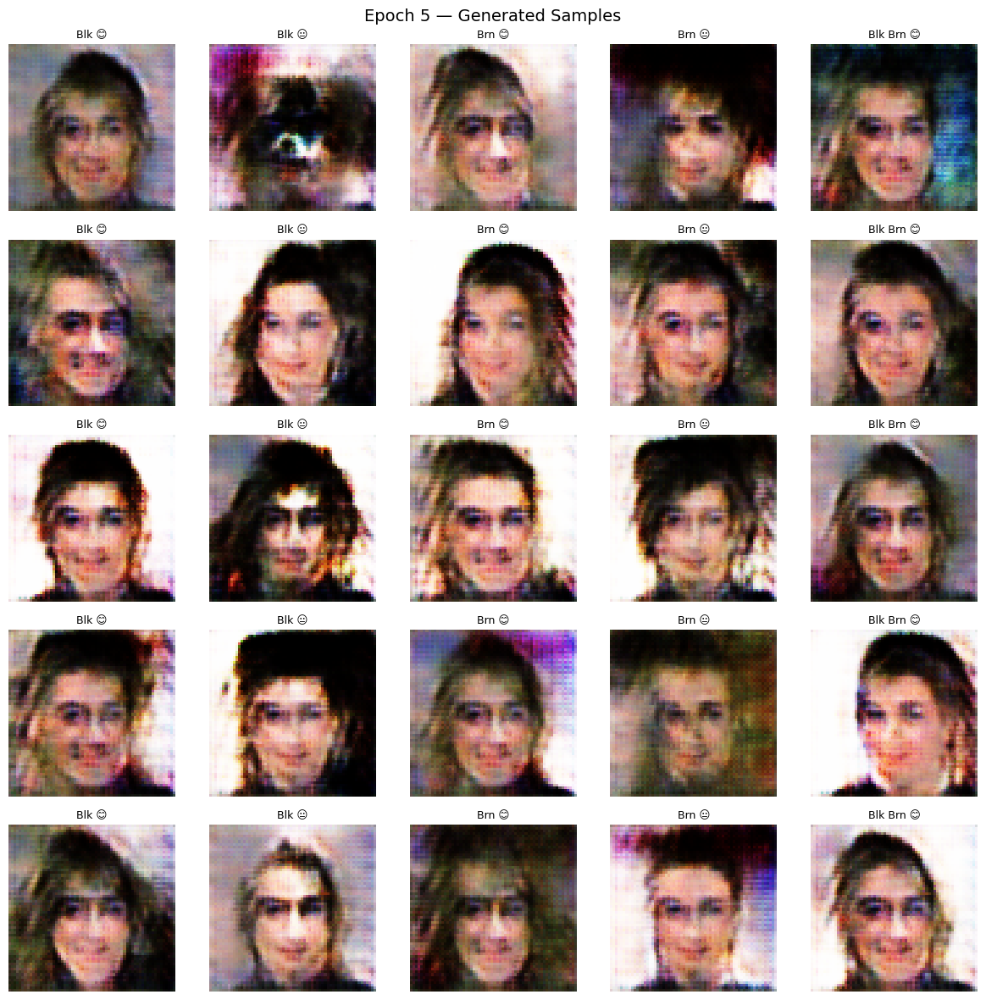

    Calculating FID ...
    FID Score @ Epoch 5: 198.15
[ 6/50] Loss_D: 0.8254 | Loss_G: 3.9521 | D(x): 0.707 | D(G(z)): 0.191/0.048 | ⏱ 88s
[ 7/50] Loss_D: 0.8182 | Loss_G: 3.8695 | D(x): 0.707 | D(G(z)): 0.190/0.051 | ⏱ 85s
[ 8/50] Loss_D: 0.8078 | Loss_G: 3.7707 | D(x): 0.711 | D(G(z)): 0.186/0.055 | ⏱ 84s
[ 9/50] Loss_D: 0.8042 | Loss_G: 3.5829 | D(x): 0.711 | D(G(z)): 0.187/0.062 | ⏱ 85s
[10/50] Loss_D: 0.8013 | Loss_G: 3.3965 | D(x): 0.711 | D(G(z)): 0.187/0.075 | ⏱ 87s


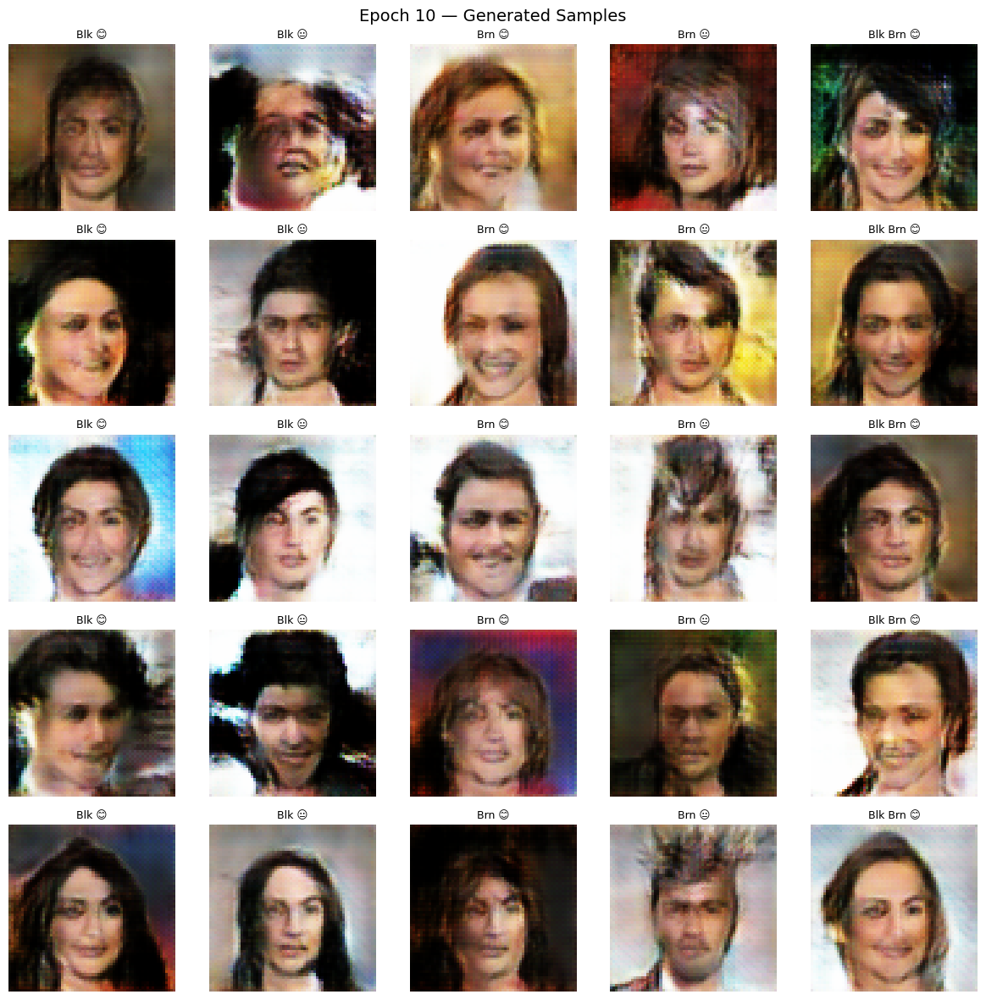

    Calculating FID ...
    FID Score @ Epoch 10: 96.32
[11/50] Loss_D: 0.8048 | Loss_G: 3.2520 | D(x): 0.709 | D(G(z)): 0.191/0.083 | ⏱ 84s
[12/50] Loss_D: 0.7992 | Loss_G: 3.1609 | D(x): 0.708 | D(G(z)): 0.190/0.090 | ⏱ 84s
[13/50] Loss_D: 0.8132 | Loss_G: 3.0966 | D(x): 0.703 | D(G(z)): 0.196/0.095 | ⏱ 84s
[14/50] Loss_D: 0.8118 | Loss_G: 3.0705 | D(x): 0.702 | D(G(z)): 0.197/0.097 | ⏱ 84s
[15/50] Loss_D: 0.8415 | Loss_G: 3.0491 | D(x): 0.692 | D(G(z)): 0.205/0.099 | ⏱ 84s


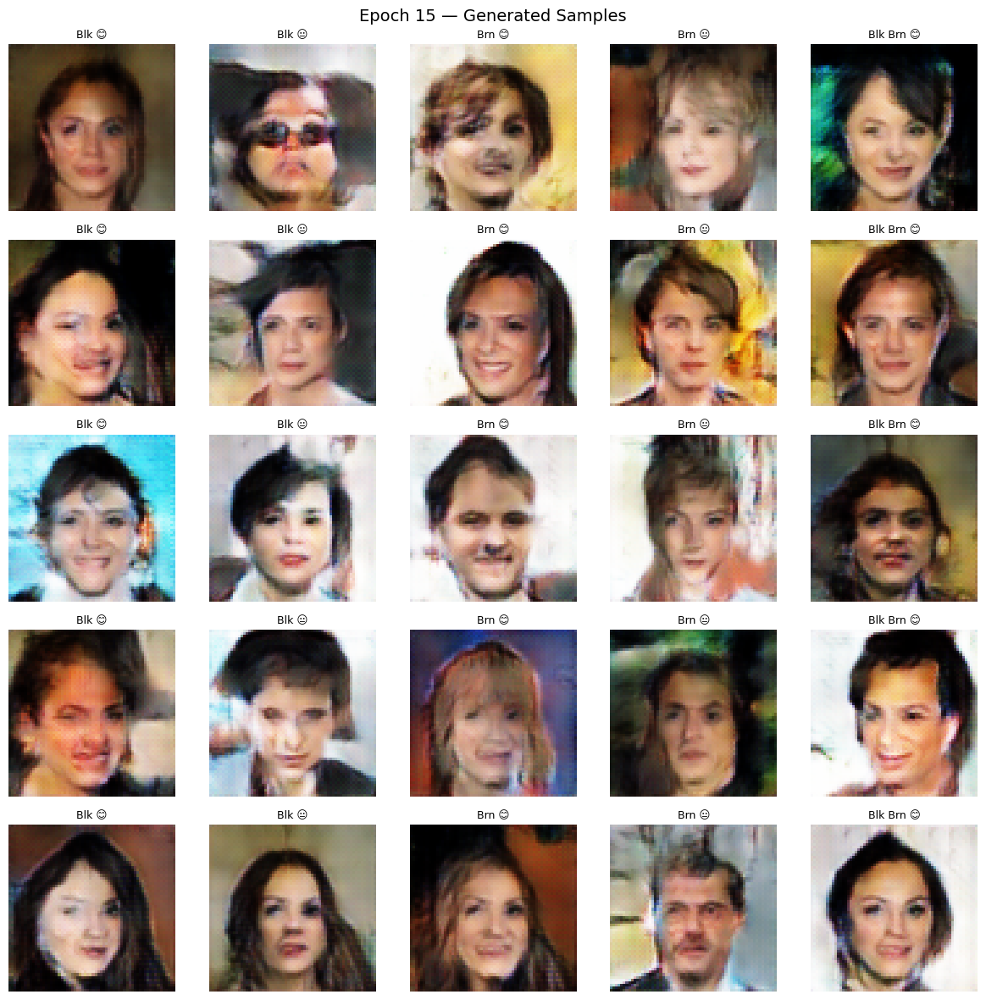

    Calculating FID ...
    FID Score @ Epoch 15: 76.22
[16/50] Loss_D: 0.7976 | Loss_G: 3.0076 | D(x): 0.706 | D(G(z)): 0.194/0.099 | ⏱ 85s
[17/50] Loss_D: 0.8127 | Loss_G: 3.0101 | D(x): 0.703 | D(G(z)): 0.195/0.102 | ⏱ 85s
[18/50] Loss_D: 0.8458 | Loss_G: 2.9056 | D(x): 0.696 | D(G(z)): 0.203/0.109 | ⏱ 85s
[19/50] Loss_D: 0.8062 | Loss_G: 2.9755 | D(x): 0.704 | D(G(z)): 0.195/0.101 | ⏱ 85s
[20/50] Loss_D: 0.7775 | Loss_G: 2.9513 | D(x): 0.713 | D(G(z)): 0.185/0.104 | ⏱ 85s


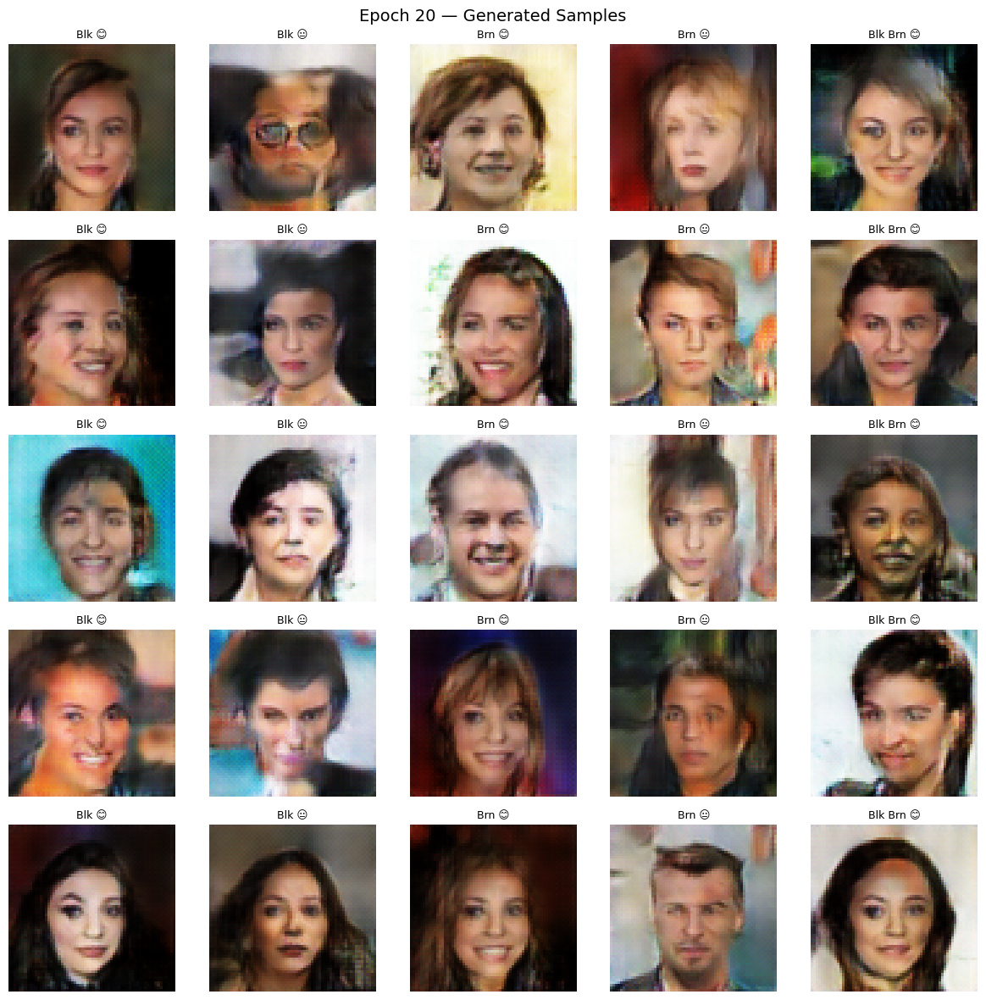

    Calculating FID ...
    FID Score @ Epoch 20: 55.62
[21/50] Loss_D: 0.7978 | Loss_G: 2.9971 | D(x): 0.710 | D(G(z)): 0.191/0.102 | ⏱ 84s
[22/50] Loss_D: 0.7489 | Loss_G: 3.0466 | D(x): 0.724 | D(G(z)): 0.174/0.096 | ⏱ 84s
[23/50] Loss_D: 0.7757 | Loss_G: 3.1228 | D(x): 0.721 | D(G(z)): 0.180/0.097 | ⏱ 85s
[24/50] Loss_D: 0.7402 | Loss_G: 3.1011 | D(x): 0.727 | D(G(z)): 0.171/0.094 | ⏱ 85s
[25/50] Loss_D: 0.8649 | Loss_G: 2.9638 | D(x): 0.704 | D(G(z)): 0.195/0.113 | ⏱ 84s


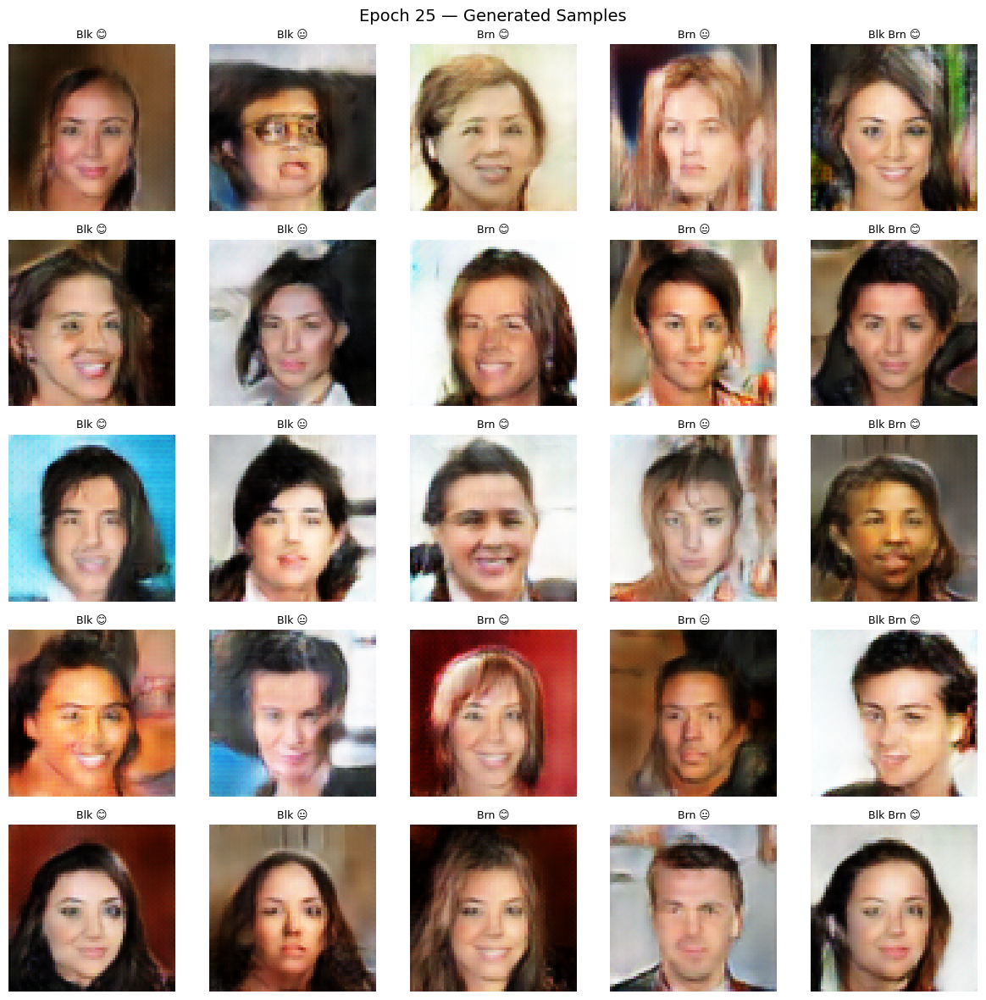

    Calculating FID ...
    FID Score @ Epoch 25: 49.76
[26/50] Loss_D: 0.7478 | Loss_G: 2.9789 | D(x): 0.727 | D(G(z)): 0.172/0.099 | ⏱ 85s
[27/50] Loss_D: 0.7143 | Loss_G: 3.1095 | D(x): 0.739 | D(G(z)): 0.161/0.093 | ⏱ 96s
[28/50] Loss_D: 0.7346 | Loss_G: 3.1851 | D(x): 0.736 | D(G(z)): 0.164/0.093 | ⏱ 95s
[29/50] Loss_D: 0.6937 | Loss_G: 3.1516 | D(x): 0.746 | D(G(z)): 0.153/0.088 | ⏱ 102s
[30/50] Loss_D: 0.7502 | Loss_G: 3.1904 | D(x): 0.739 | D(G(z)): 0.162/0.094 | ⏱ 91s


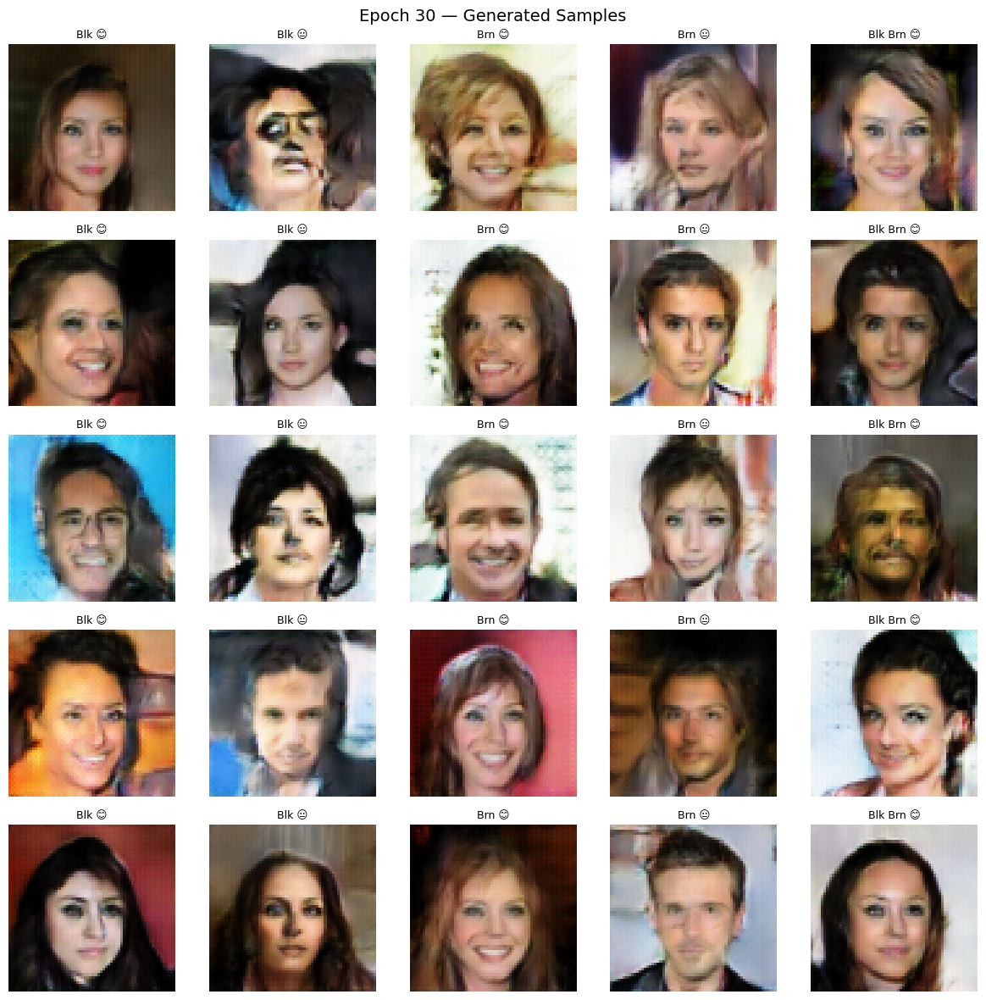

    Calculating FID ...
    FID Score @ Epoch 30: 49.24
[31/50] Loss_D: 0.6643 | Loss_G: 3.2100 | D(x): 0.757 | D(G(z)): 0.142/0.083 | ⏱ 91s
[32/50] Loss_D: 0.6958 | Loss_G: 3.2186 | D(x): 0.752 | D(G(z)): 0.147/0.089 | ⏱ 88s
[33/50] Loss_D: 0.6645 | Loss_G: 3.3431 | D(x): 0.762 | D(G(z)): 0.138/0.080 | ⏱ 128s
[34/50] Loss_D: 0.8641 | Loss_G: 3.1071 | D(x): 0.726 | D(G(z)): 0.176/0.119 | ⏱ 89s
[35/50] Loss_D: 0.6733 | Loss_G: 3.0938 | D(x): 0.749 | D(G(z)): 0.149/0.089 | ⏱ 85s


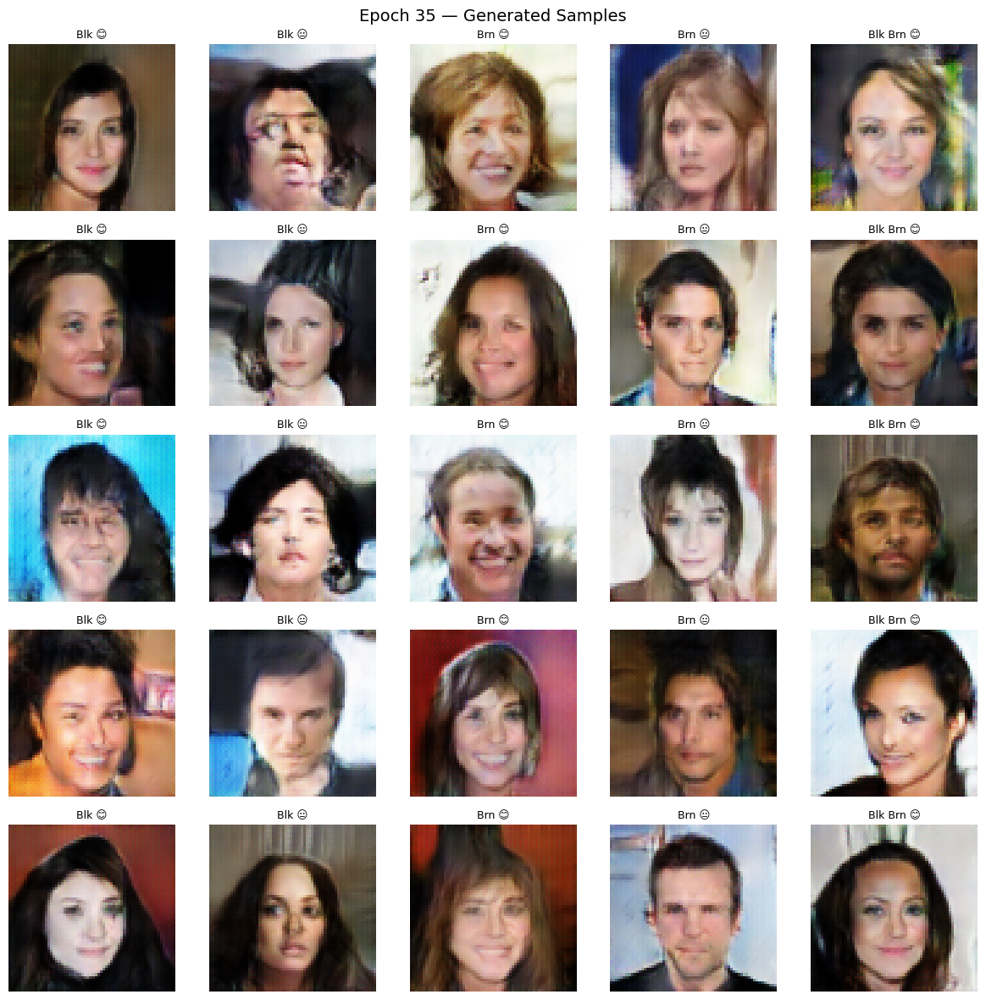

    Calculating FID ...
    FID Score @ Epoch 35: 48.54
[36/50] Loss_D: 0.6333 | Loss_G: 3.3860 | D(x): 0.773 | D(G(z)): 0.127/0.077 | ⏱ 85s
[37/50] Loss_D: 0.6026 | Loss_G: 3.4490 | D(x): 0.784 | D(G(z)): 0.116/0.070 | ⏱ 87s
[38/50] Loss_D: 0.7561 | Loss_G: 3.3482 | D(x): 0.749 | D(G(z)): 0.151/0.093 | ⏱ 89s
[39/50] Loss_D: 0.5898 | Loss_G: 3.4572 | D(x): 0.788 | D(G(z)): 0.111/0.069 | ⏱ 95s
[40/50] Loss_D: 0.7391 | Loss_G: 3.2686 | D(x): 0.753 | D(G(z)): 0.147/0.094 | ⏱ 89s


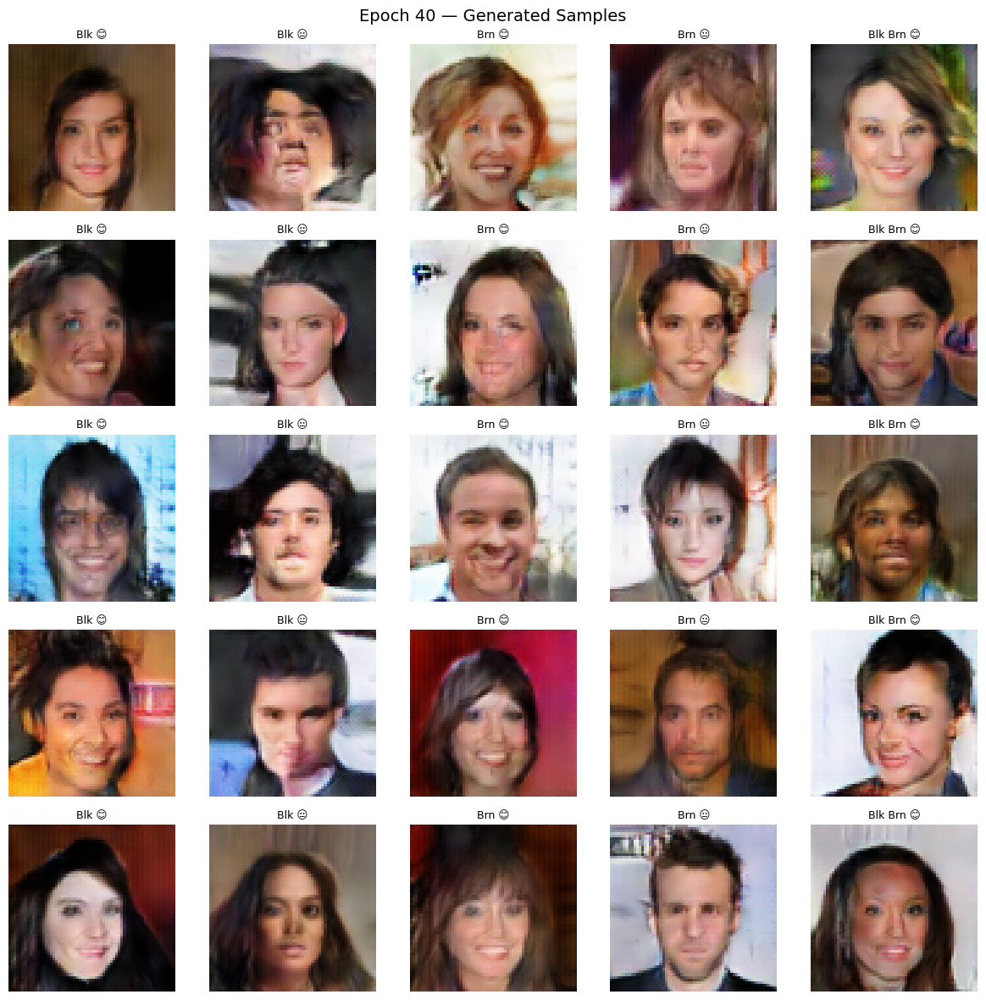

    Calculating FID ...
    FID Score @ Epoch 40: 47.75
[41/50] Loss_D: 0.5690 | Loss_G: 3.5220 | D(x): 0.797 | D(G(z)): 0.102/0.064 | ⏱ 86s
[42/50] Loss_D: 0.5895 | Loss_G: 3.6363 | D(x): 0.796 | D(G(z)): 0.105/0.063 | ⏱ 89s
[43/50] Loss_D: 0.6058 | Loss_G: 3.6591 | D(x): 0.792 | D(G(z)): 0.108/0.068 | ⏱ 89s
[44/50] Loss_D: 0.8556 | Loss_G: 3.2413 | D(x): 0.733 | D(G(z)): 0.169/0.117 | ⏱ 85s
[45/50] Loss_D: 0.6304 | Loss_G: 3.3109 | D(x): 0.772 | D(G(z)): 0.127/0.076 | ⏱ 85s


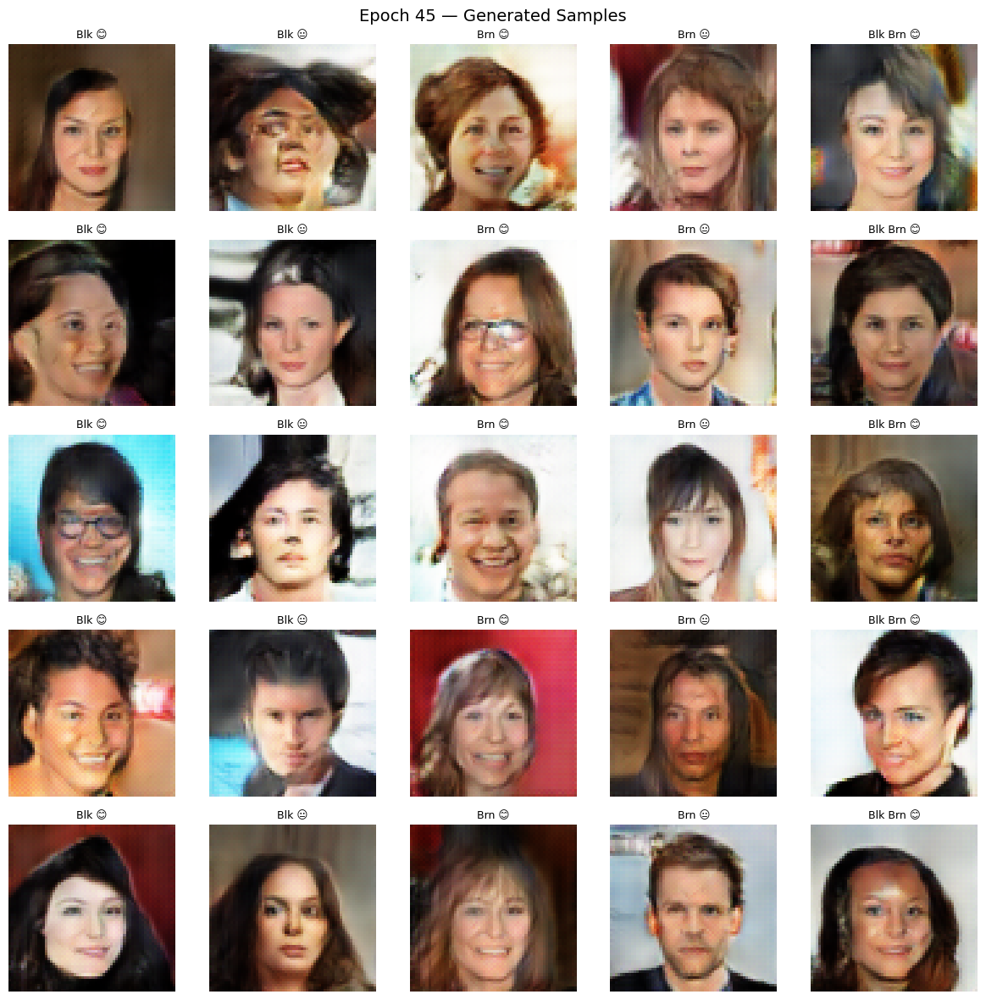

    Calculating FID ...
    FID Score @ Epoch 45: 48.19
[46/50] Loss_D: 0.5698 | Loss_G: 3.6424 | D(x): 0.801 | D(G(z)): 0.098/0.063 | ⏱ 86s
[47/50] Loss_D: 0.5553 | Loss_G: 3.7079 | D(x): 0.808 | D(G(z)): 0.091/0.057 | ⏱ 84s
[48/50] Loss_D: 0.6209 | Loss_G: 3.6677 | D(x): 0.793 | D(G(z)): 0.108/0.068 | ⏱ 86s
[49/50] Loss_D: 0.5570 | Loss_G: 3.7708 | D(x): 0.811 | D(G(z)): 0.089/0.055 | ⏱ 85s
[50/50] Loss_D: 0.5338 | Loss_G: 3.8044 | D(x): 0.818 | D(G(z)): 0.082/0.052 | ⏱ 84s


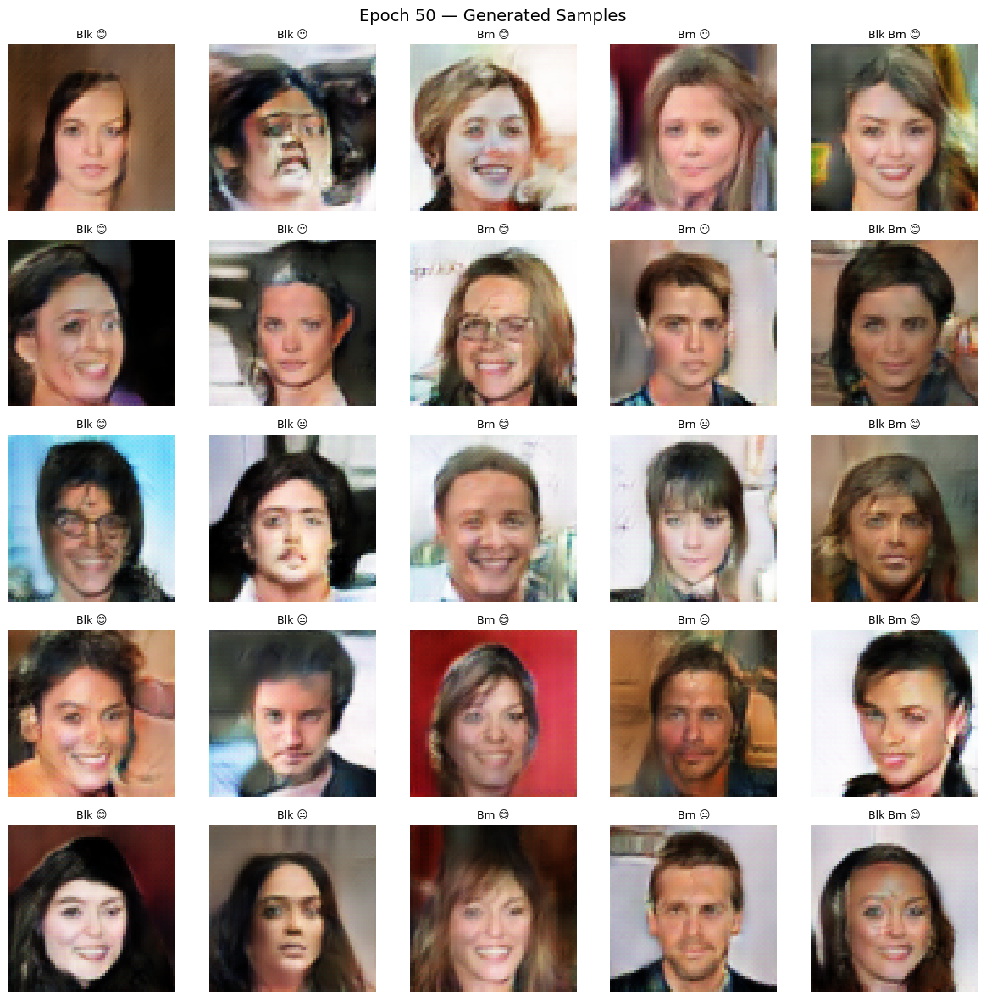

    Calculating FID ...
    FID Score @ Epoch 50: 43.30

 Training Complete! — Total time: 81.4 minutes
   Best FID: 43.30 (Epoch 50)


In [4]:
# ============================================================
#  Cell 4: Conditional GAN Training Loop
# ============================================================

import time

# History storage
history = {
    'G_losses': [],
    'D_losses': [],
    'D_x': [],        # D output on real images
    'D_G_z1': [],     # D output on fake images (before G update)
    'D_G_z2': [],     # D output on fake images (after G update)
    'fid_scores': [],
    'fid_epochs': [],
    'epoch_G_losses': [],
    'epoch_D_losses': [],
}

# Store generated images for visualization
generated_samples = {}

print("=" * 60)
print(" Start Conditional GAN Training")
print("=" * 60)
print(f"   Epochs: {CONFIG['num_epochs']}")
print(f"   Batch size: {CONFIG['batch_size']}")
print(f"   Generator LR: {CONFIG['lr_g']}")
print(f"   Discriminator LR: {CONFIG['lr_d']}")
print(f"   Label Smoothing: real={CONFIG['real_label_val']}, fake={CONFIG['fake_label_val']}")
print(f"   Device: {DEVICE}")
print("=" * 60)

total_start = time.time()

for epoch in range(CONFIG['num_epochs']):
    epoch_start = time.time()
    
    epoch_G_loss = 0.0
    epoch_D_loss = 0.0
    epoch_D_x = 0.0
    epoch_D_G_z1 = 0.0
    epoch_D_G_z2 = 0.0
    num_batches = 0
    
    netG.train()
    netD.train()
    
    for i, (real_imgs, real_labels) in enumerate(train_loader):
        real_imgs = real_imgs.to(DEVICE)
        real_labels = real_labels.to(DEVICE)  # (B, 3)
        b_size = real_imgs.size(0)
        
        # ============ Train Discriminator ============
        netD.zero_grad()
        
        # --- Real ---
        label_real = torch.full((b_size,), CONFIG['real_label_val'], 
                                dtype=torch.float32, device=DEVICE)
        output_real = netD(real_imgs, real_labels)
        errD_real = criterion(output_real, label_real)
        errD_real.backward()
        D_x = output_real.mean().item()
        
        # --- Fake ---
        noise = torch.randn(b_size, CONFIG['nz'], 1, 1, device=DEVICE)
        fake_imgs = netG(noise, real_labels)
        
        label_fake = torch.full((b_size,), CONFIG['fake_label_val'],
                                dtype=torch.float32, device=DEVICE)
        output_fake = netD(fake_imgs.detach(), real_labels)
        errD_fake = criterion(output_fake, label_fake)
        errD_fake.backward()
        D_G_z1 = output_fake.mean().item()
        
        errD = errD_real + errD_fake
        optimizerD.step()
        
        # ============ Train Generator ============
        netG.zero_grad()
        
        label_g = torch.full((b_size,), 1.0, dtype=torch.float32, device=DEVICE)
        output_g = netD(fake_imgs, real_labels)
        errG = criterion(output_g, label_g)
        errG.backward()
        D_G_z2 = output_g.mean().item()
        
        optimizerG.step()
        
        # Store batch statistics
        history['G_losses'].append(errG.item())
        history['D_losses'].append(errD.item())
        history['D_x'].append(D_x)
        history['D_G_z1'].append(D_G_z1)
        history['D_G_z2'].append(D_G_z2)
        
        epoch_G_loss += errG.item()
        epoch_D_loss += errD.item()
        epoch_D_x += D_x
        epoch_D_G_z1 += D_G_z1
        epoch_D_G_z2 += D_G_z2
        num_batches += 1
    
    # Epoch averages
    avg_G = epoch_G_loss / num_batches
    avg_D = epoch_D_loss / num_batches
    avg_Dx = epoch_D_x / num_batches
    avg_DGz1 = epoch_D_G_z1 / num_batches
    avg_DGz2 = epoch_D_G_z2 / num_batches
    
    history['epoch_G_losses'].append(avg_G)
    history['epoch_D_losses'].append(avg_D)
    
    epoch_time = time.time() - epoch_start
    
    # Print status
    print(f"[{epoch+1:2d}/{CONFIG['num_epochs']}] "
          f"Loss_D: {avg_D:.4f} | Loss_G: {avg_G:.4f} | "
          f"D(x): {avg_Dx:.3f} | D(G(z)): {avg_DGz1:.3f}/{avg_DGz2:.3f} | "
          f"⏱ {epoch_time:.0f}s")
    
    # ===== Generate Samples every N epochs =====
    if (epoch + 1) % CONFIG['sample_interval'] == 0 or (epoch + 1) == CONFIG['num_epochs']:
        
        # Generate samples using fixed_noise and fixed_labels
        netG.eval()
        with torch.no_grad():
            fake_samples = netG(fixed_noise, fixed_labels).cpu()
        netG.train()
        generated_samples[epoch + 1] = fake_samples
        
        # Visualization
        fig, axes = plt.subplots(5, 5, figsize=(12, 12))
        for idx, ax in enumerate(axes.flat):
            img = fake_samples[idx].permute(1, 2, 0).numpy() * 0.5 + 0.5
            img = np.clip(img, 0, 1)
            ax.imshow(img)
            lbl = fixed_labels[idx].cpu()
            parts = []
            if lbl[0] == 1: parts.append("Blk")
            if lbl[1] == 1: parts.append("Brn")
            if lbl[2] == 1: parts.append("😊")
            else: parts.append("😐")
            ax.set_title(" ".join(parts), fontsize=9)
            ax.axis('off')
        plt.suptitle(f"Epoch {epoch+1} — Generated Samples", fontsize=14)
        plt.tight_layout()
        plt.show()
    
    # ===== FID Calculation =====
    if (epoch + 1) % CONFIG['fid_interval'] == 0 or (epoch + 1) == CONFIG['num_epochs']:
        print(f"    Calculating FID ...")
        fid_score = fid_calc.compute_fid(netG, real_mu, real_sigma, 
                                          num_samples=CONFIG['fid_samples'])
        history['fid_scores'].append(fid_score)
        history['fid_epochs'].append(epoch + 1)
        print(f"    FID Score @ Epoch {epoch+1}: {fid_score:.2f}")

total_time = time.time() - total_start
print("\n" + "=" * 60)
print(f" Training Complete! — Total time: {total_time/60:.1f} minutes")
if history['fid_scores']:
    best_fid_idx = np.argmin(history['fid_scores'])
    print(f"   Best FID: {history['fid_scores'][best_fid_idx]:.2f} (Epoch {history['fid_epochs'][best_fid_idx]})")
print("=" * 60)


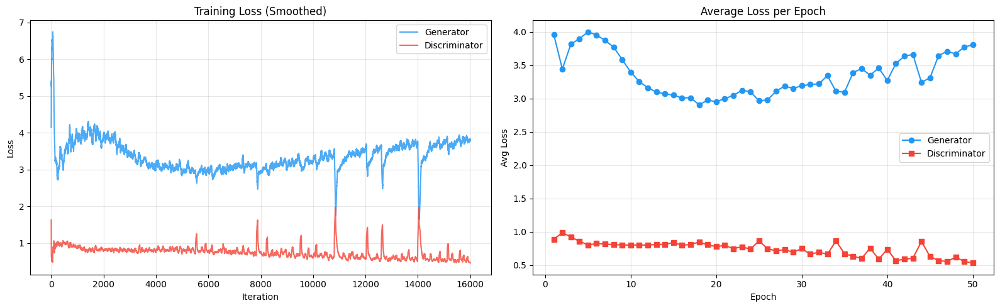

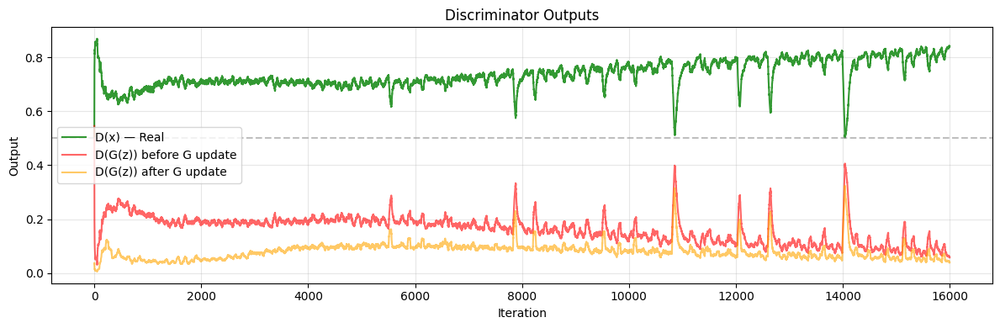

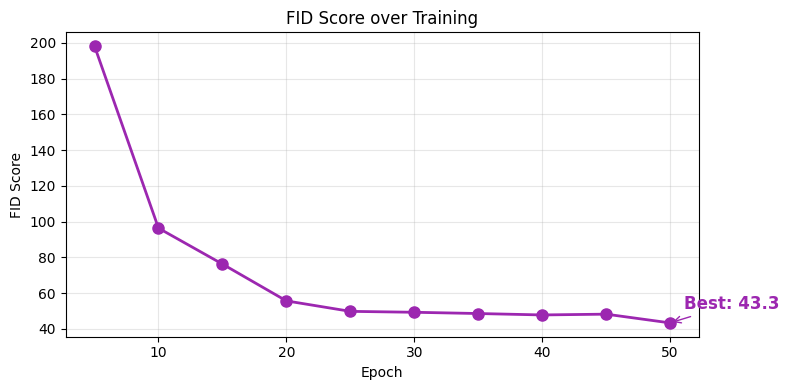


 Targeted Conditional Generation Scenarios


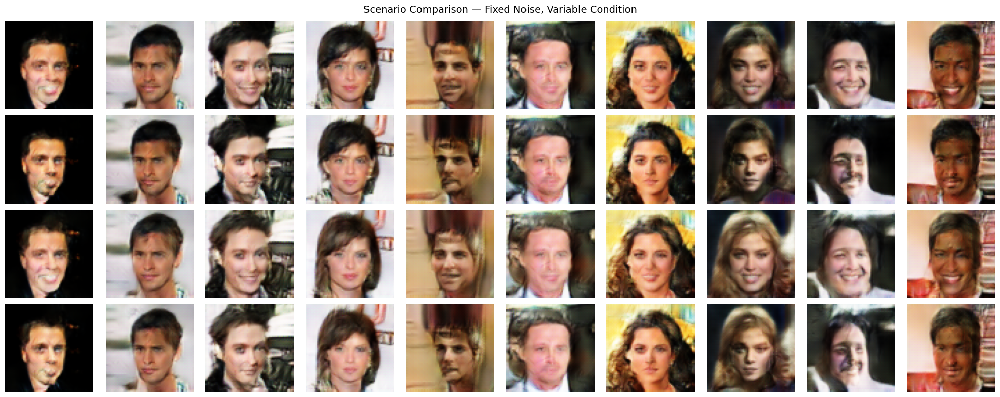


🔄 Comparing Smiling Effect (Fixed Noise & Hair Color):


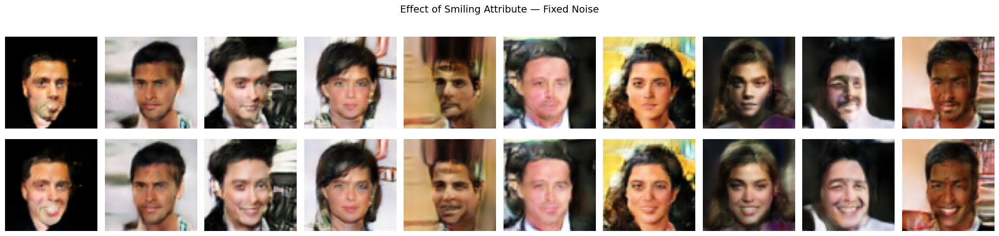


 Comparing Hair Color Effect (Fixed Noise & Smile):


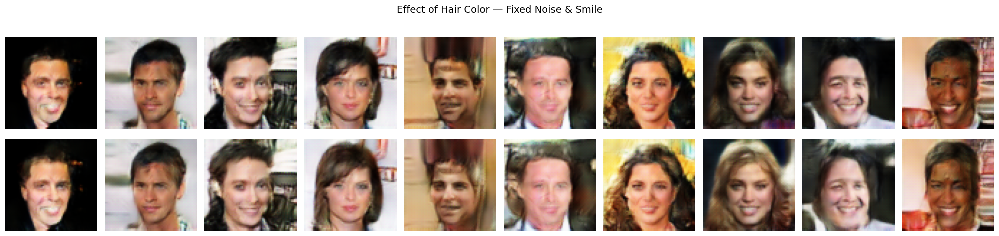


📸 Real vs Fake Comparison:


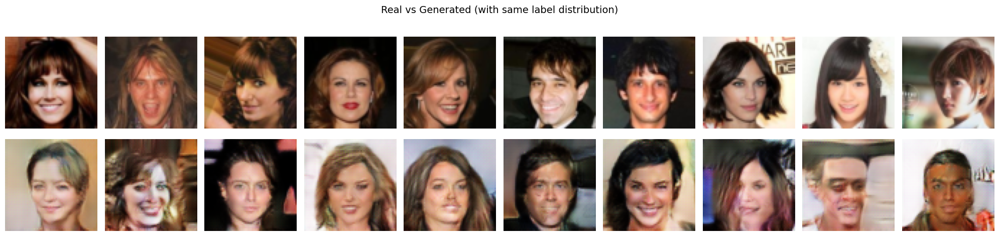


 Conditional GAN Results Summary
  Parameter                                Value
  ---------------------------------------------
  Epochs                                      50
  Batch Size                                 256
  Image Size                                  64
  nz (noise dim)                             100
  n_classes                                    3
  ngf                                         32
  ndf                                         32
  LR Generator                            0.0002
  LR Discriminator                        0.0004
  Label Smoothing (real)                     0.9
  Loss Function                          BCELoss
  Conditioning Method              Concatenation
  Generator Params                     1,269,504
  Discriminator Params                   853,184
  Total Params                         2,122,688
  Dataset Size                            82,008
  Best FID                                 43.30
  Best FID Epoch                    

In [6]:
# ============================================================
#  Cell 5: Final Evaluation and Conditional Generation Scenarios
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import torch

# ==================== 1. Loss Plots ====================
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Loss per iteration (smoothed)
window = 50
if len(history['G_losses']) > window:
    G_smooth = pd.Series(history['G_losses']).rolling(window=window, min_periods=1).mean()
    D_smooth = pd.Series(history['D_losses']).rolling(window=window, min_periods=1).mean()
else:
    G_smooth = history['G_losses']
    D_smooth = history['D_losses']

axes[0].plot(G_smooth, label='Generator', alpha=0.8, color='#2196F3')
axes[0].plot(D_smooth, label='Discriminator', alpha=0.8, color='#F44336')
axes[0].set_xlabel('Iteration')
axes[0].set_ylabel('Loss')
axes[0].set_title('Training Loss (Smoothed)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Loss per epoch
epochs_range = range(1, CONFIG['num_epochs'] + 1)
axes[1].plot(epochs_range, history['epoch_G_losses'], 'o-', label='Generator', color='#2196F3')
axes[1].plot(epochs_range, history['epoch_D_losses'], 's-', label='Discriminator', color='#F44336')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Avg Loss')
axes[1].set_title('Average Loss per Epoch')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ==================== 2. D(x) and D(G(z)) Plots ====================
fig, ax = plt.subplots(figsize=(12, 4))

if len(history['D_x']) > window:
    Dx_smooth = pd.Series(history['D_x']).rolling(window=window, min_periods=1).mean()
    DGz1_smooth = pd.Series(history['D_G_z1']).rolling(window=window, min_periods=1).mean()
    DGz2_smooth = pd.Series(history['D_G_z2']).rolling(window=window, min_periods=1).mean()
else:
    Dx_smooth = history['D_x']
    DGz1_smooth = history['D_G_z1']
    DGz2_smooth = history['D_G_z2']

ax.plot(Dx_smooth, label='D(x) — Real', color='green', alpha=0.8)
ax.plot(DGz1_smooth, label='D(G(z)) before G update', color='red', alpha=0.6)
ax.plot(DGz2_smooth, label='D(G(z)) after G update', color='orange', alpha=0.6)
ax.axhline(y=0.5, color='gray', linestyle='--', alpha=0.5)
ax.set_xlabel('Iteration')
ax.set_ylabel('Output')
ax.set_title('Discriminator Outputs')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# ==================== 3. FID Score Plot ====================
if history['fid_scores']:
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.plot(history['fid_epochs'], history['fid_scores'], 'o-', color='#9C27B0', linewidth=2, markersize=8)
    ax.set_xlabel('Epoch')
    ax.set_ylabel('FID Score')
    ax.set_title('FID Score over Training')
    best_idx = np.argmin(history['fid_scores'])
    ax.annotate(f"Best: {history['fid_scores'][best_idx]:.1f}",
                xy=(history['fid_epochs'][best_idx], history['fid_scores'][best_idx]),
                xytext=(10, 10), textcoords='offset points',
                fontsize=12, fontweight='bold', color='#9C27B0',
                arrowprops=dict(arrowstyle='->', color='#9C27B0'))
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# ==================== 4. Conditional Scenarios ====================
print("\n" + "=" * 60)
print(" Targeted Conditional Generation Scenarios")
print("=" * 60)

netG.eval()
n_scenario = 10

# Shared fixed noise across scenarios
shared_noise = torch.randn(n_scenario, CONFIG['nz'], 1, 1, device=DEVICE)

scenarios = {
    'Scenario 1: Black Hair + Smiling': [1, 0, 1],
    'Scenario 2: Black Hair + No Smile': [1, 0, 0],
    'Scenario 3: Brown Hair + Smiling': [0, 1, 1],
    'Scenario 4: Brown Hair + No Smile': [0, 1, 0],
}

scenario_images = {}
for name, label_vals in scenarios.items():
    labels = torch.tensor([label_vals] * n_scenario, dtype=torch.float32, device=DEVICE)
    with torch.no_grad():
        imgs = netG(shared_noise, labels).cpu()
    scenario_images[name] = imgs

# Visualization: One row per scenario
fig, axes = plt.subplots(len(scenarios), n_scenario, figsize=(20, 8))
for row, (name, imgs) in enumerate(scenario_images.items()):
    for col in range(n_scenario):
        img = imgs[col].permute(1, 2, 0).numpy() * 0.5 + 0.5
        img = np.clip(img, 0, 1)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_ylabel(name, fontsize=10, rotation=0, labelpad=120, va='center')

plt.suptitle("Scenario Comparison — Fixed Noise, Variable Condition", fontsize=14)
plt.tight_layout()
plt.show()

# ==================== 5. Effect of Smiling with Fixed Noise ====================
print("\n🔄 Comparing Smiling Effect (Fixed Noise & Hair Color):")

fig, axes = plt.subplots(2, n_scenario, figsize=(20, 5))

# Row 1: Black Hair + No Smile
labels_no_smile = torch.tensor([[1, 0, 0]] * n_scenario, dtype=torch.float32, device=DEVICE)
with torch.no_grad():
    imgs_no_smile = netG(shared_noise, labels_no_smile).cpu()

# Row 2: Black Hair + Smile  
labels_smile = torch.tensor([[1, 0, 1]] * n_scenario, dtype=torch.float32, device=DEVICE)
with torch.no_grad():
    imgs_smile = netG(shared_noise, labels_smile).cpu()

row_titles = ['Black Hair — No Smile 😐', 'Black Hair — Smiling 😊']
for row, imgs in enumerate([imgs_no_smile, imgs_smile]):
    for col in range(n_scenario):
        img = imgs[col].permute(1, 2, 0).numpy() * 0.5 + 0.5
        img = np.clip(img, 0, 1)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_ylabel(row_titles[row], fontsize=10, rotation=0, labelpad=140, va='center')

plt.suptitle("Effect of Smiling Attribute — Fixed Noise", fontsize=14)
plt.tight_layout()
plt.show()

# ==================== 6. Effect of Hair Color with Fixed Noise ====================
print("\n Comparing Hair Color Effect (Fixed Noise & Smile):")

fig, axes = plt.subplots(2, n_scenario, figsize=(20, 5))

# Row 1: Black Hair + Smile
labels_black = torch.tensor([[1, 0, 1]] * n_scenario, dtype=torch.float32, device=DEVICE)
with torch.no_grad():
    imgs_black = netG(shared_noise, labels_black).cpu()

# Row 2: Brown Hair + Smile
labels_brown = torch.tensor([[0, 1, 1]] * n_scenario, dtype=torch.float32, device=DEVICE)
with torch.no_grad():
    imgs_brown = netG(shared_noise, labels_brown).cpu()

row_titles = ['Black Hair + Smile', 'Brown Hair + Smile']
for row, imgs in enumerate([imgs_black, imgs_brown]):
    for col in range(n_scenario):
        img = imgs[col].permute(1, 2, 0).numpy() * 0.5 + 0.5
        img = np.clip(img, 0, 1)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_ylabel(row_titles[row], fontsize=10, rotation=0, labelpad=120, va='center')

plt.suptitle("Effect of Hair Color — Fixed Noise & Smile", fontsize=14)
plt.tight_layout()
plt.show()

# ==================== 7. Real vs Fake Comparison ====================
print("\n📸 Real vs Fake Comparison:")

fig, axes = plt.subplots(2, 10, figsize=(20, 5))

# Top row: Real
real_batch, real_batch_labels = next(iter(train_loader))
for col in range(10):
    img = real_batch[col].permute(1, 2, 0).numpy() * 0.5 + 0.5
    img = np.clip(img, 0, 1)
    axes[0, col].imshow(img)
    axes[0, col].axis('off')
    if col == 0:
        axes[0, col].set_ylabel('Real', fontsize=14, fontweight='bold', rotation=0, labelpad=40, va='center')

# Bottom row: Generated (using same labels as real)
with torch.no_grad():
    noise_compare = torch.randn(10, CONFIG['nz'], 1, 1, device=DEVICE)
    fake_compare = netG(noise_compare, real_batch_labels[:10].to(DEVICE)).cpu()

for col in range(10):
    img = fake_compare[col].permute(1, 2, 0).numpy() * 0.5 + 0.5
    img = np.clip(img, 0, 1)
    axes[1, col].imshow(img)
    axes[1, col].axis('off')
    if col == 0:
        axes[1, col].set_ylabel('Fake', fontsize=14, fontweight='bold', rotation=0, labelpad=40, va='center')

plt.suptitle("Real vs Generated (with same label distribution)", fontsize=14)
plt.tight_layout()
plt.show()

netG.train()

# ==================== 8. Summary Table ====================
print("\n" + "=" * 60)
print(" Conditional GAN Results Summary")
print("=" * 60)
print(f"  {'Parameter':<30} {'Value':>15}")
print(f"  {'-'*45}")
print(f"  {'Epochs':<30} {CONFIG['num_epochs']:>15}")
print(f"  {'Batch Size':<30} {CONFIG['batch_size']:>15}")
print(f"  {'Image Size':<30} {CONFIG['image_size']:>15}")
print(f"  {'nz (noise dim)':<30} {CONFIG['nz']:>15}")
print(f"  {'n_classes':<30} {CONFIG['n_classes']:>15}")
print(f"  {'ngf':<30} {CONFIG['ngf']:>15}")
print(f"  {'ndf':<30} {CONFIG['ndf']:>15}")
print(f"  {'LR Generator':<30} {CONFIG['lr_g']:>15}")
print(f"  {'LR Discriminator':<30} {CONFIG['lr_d']:>15}")
print(f"  {'Label Smoothing (real)':<30} {CONFIG['real_label_val']:>15}")
print(f"  {'Loss Function':<30} {'BCELoss':>15}")
print(f"  {'Conditioning Method':<30} {'Concatenation':>15}")
try:
    print(f"  {'Generator Params':<30} {count_params(netG):>15,}")
    print(f"  {'Discriminator Params':<30} {count_params(netD):>15,}")
    print(f"  {'Total Params':<30} {count_params(netG)+count_params(netD):>15,}")
except:
    pass
print(f"  {'Dataset Size':<30} {len(dataset):>15,}")
if history['fid_scores']:
    best_fid_idx = np.argmin(history['fid_scores'])
    print(f"  {'Best FID':<30} {history['fid_scores'][best_fid_idx]:>15.2f}")
    print(f"  {'Best FID Epoch':<30} {history['fid_epochs'][best_fid_idx]:>15}")
    print(f"  {'Final FID':<30} {history['fid_scores'][-1]:>15.2f}")
if history['epoch_G_losses']:
    print(f"  {'Final G Loss':<30} {history['epoch_G_losses'][-1]:>15.4f}")
    print(f"  {'Final D Loss':<30} {history['epoch_D_losses'][-1]:>15.4f}")
print(f"  {'-'*45}")

print("\n" + "=" * 60)
print(" Conditio Notebook Completed!")
print("=" * 60)


